In [54]:
def svd(img_arr, k):
    img_arr_R = img_arr[:, :, 0]
    u_R, s_R, v_R = np.linalg.svd(img_arr_R)
    
    img_arr_G = img_arr[:, :, 1]
    u_G, s_G, v_G = np.linalg.svd(img_arr_G)
    
    img_arr_B = img_arr[:, :, 2]
    u_B, s_B, v_B = np.linalg.svd(img_arr_B)

    temp_arr_R = u_R[:, :k] @ np.diag(s_R[:k]) @ v_R[:k, :]
    temp_arr_G = u_G[:, :k] @ np.diag(s_G[:k]) @ v_G[:k, :]
    temp_arr_B = u_B[:, :k] @ np.diag(s_B[:k]) @ v_B[:k, :]
    
    temp_arr = np.zeros([2048, 2048, 3])
    temp_arr[:, :, 0] = temp_arr_R
    temp_arr[:, :, 1] = temp_arr_G
    temp_arr[:, :, 2] = temp_arr_B

    return temp_arr, np.concatenate([u_R[:, :k].flatten(), s_R[:k], v_R[:k, :].flatten(), u_G[:, :k].flatten(), s_G[:k], v_G[:k, :].flatten(), u_B[:, :k].flatten(), s_B[:k], v_B[:k, :].flatten()])

In [2]:
import numpy as np
from PIL import Image
ai_arr = []
for i in range(1, 51):
    img = Image.open('Apples/Ai/Red Apples/Side Shots/red-apple-ss-' + str(i) + '.jpg')
    _, temp_ai_arr = svd(np.array(img), 48)
    ai_arr.append(temp_ai_arr)
print(len(ai_arr), len(ai_arr[0]))
ai_arr = np.array(ai_arr).reshape([50, 589968])
ai_arr = ai_arr.tolist()
for i in range(50):
    ai_arr[i].append(0)
print(len(ai_arr), len(ai_arr[0]))
print(ai_arr[0][-1])

50 589968
50 589969
0


In [3]:
import numpy as np
from PIL import Image
real_arr = []
for i in range(1, 70):
    img = Image.open('Apples/Real/Red Apples/Side Shots/red-apple-ss-' + str(i) + '.jpg')
    _, temp_real_arr = svd(np.array(img)[(2240-2048)//2: (2240+2048)//2, (3984-2048)//2: (3984+2048)//2], 48)
    real_arr.append(temp_real_arr)
print(len(real_arr), len(real_arr[0]))
real_arr = np.array(real_arr).reshape([69, 589968])
real_arr = real_arr.tolist()
for i in range(69):
    real_arr[i].append(0)
print(len(real_arr), len(real_arr[0]))
print(real_arr[0][-1])

69 589968
69 589969
0


In [8]:
import csv
 
with open('apple_data.csv', 'w') as f:
    # using csv.writer method from CSV package
    write = csv.writer(f)
    write.writerows([[str(i) for i in range(589969)]] + ai_arr + real_arr)

In [1]:
import pandas as pd
df = pd.read_csv('apple_data.csv')

In [2]:
df.head(3)

,0,1,2,3,4,5,6,7,8,9,...,589959,589960,589961,589962,589963,589964,589965,589966,589967,589968
0,-0.010394,-0.001491,0.007914,-0.009385,-0.001177,0.023525,-0.025093,0.015371,-0.013922,0.019492,...,-0.016201,-0.009918,-0.008565,-0.007188,-0.005132,-0.002214,0.001687,0.004624,0.006867,0
1,-0.022907,0.014926,0.030529,-0.019711,-0.002261,0.017179,0.013378,0.013599,-0.004041,-0.001797,...,0.003985,0.005936,0.004860,0.004203,0.002756,0.001766,-0.001197,-0.001976,-0.001420,0
2,-0.008377,-0.007313,0.010049,-0.002445,0.003348,0.020935,-0.011579,-0.038075,0.015339,0.002342,...,-0.014617,-0.014530,-0.017696,-0.020197,-0.019761,-0.017645,-0.016687,-0.017881,-0.019920,0


38


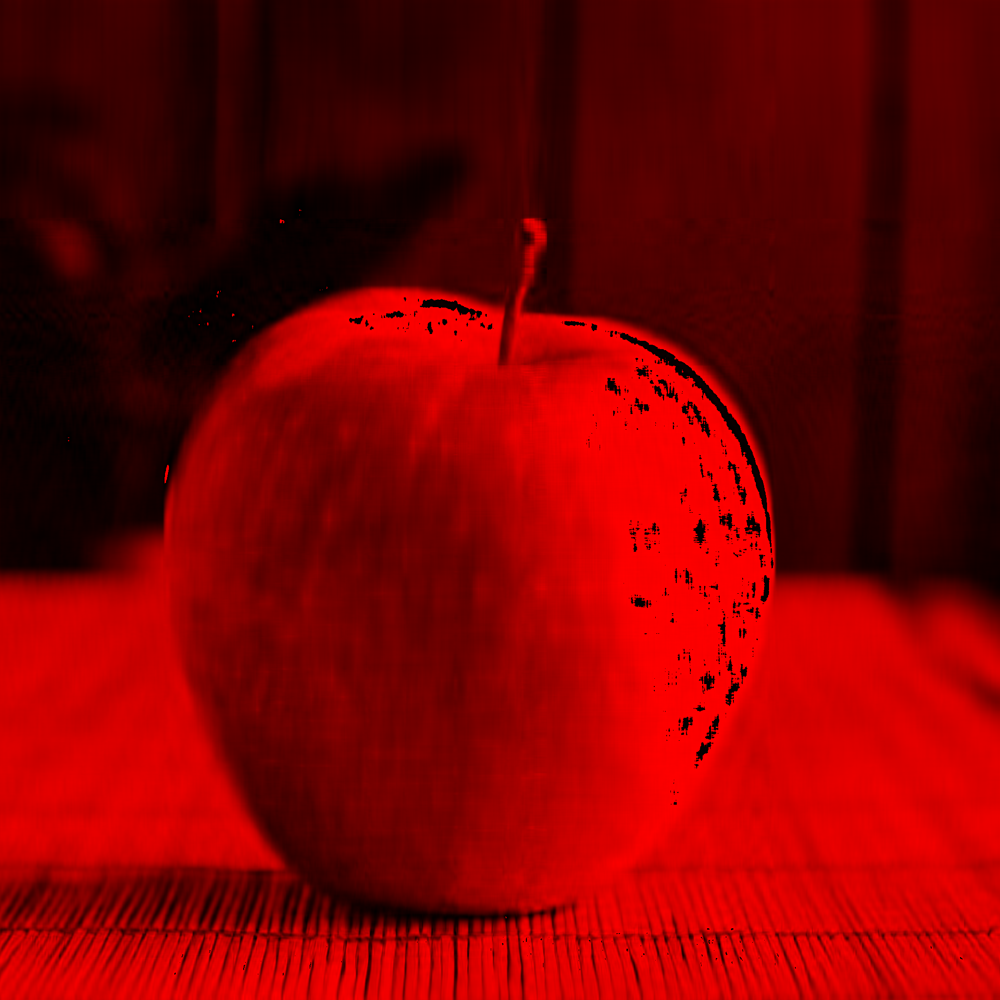

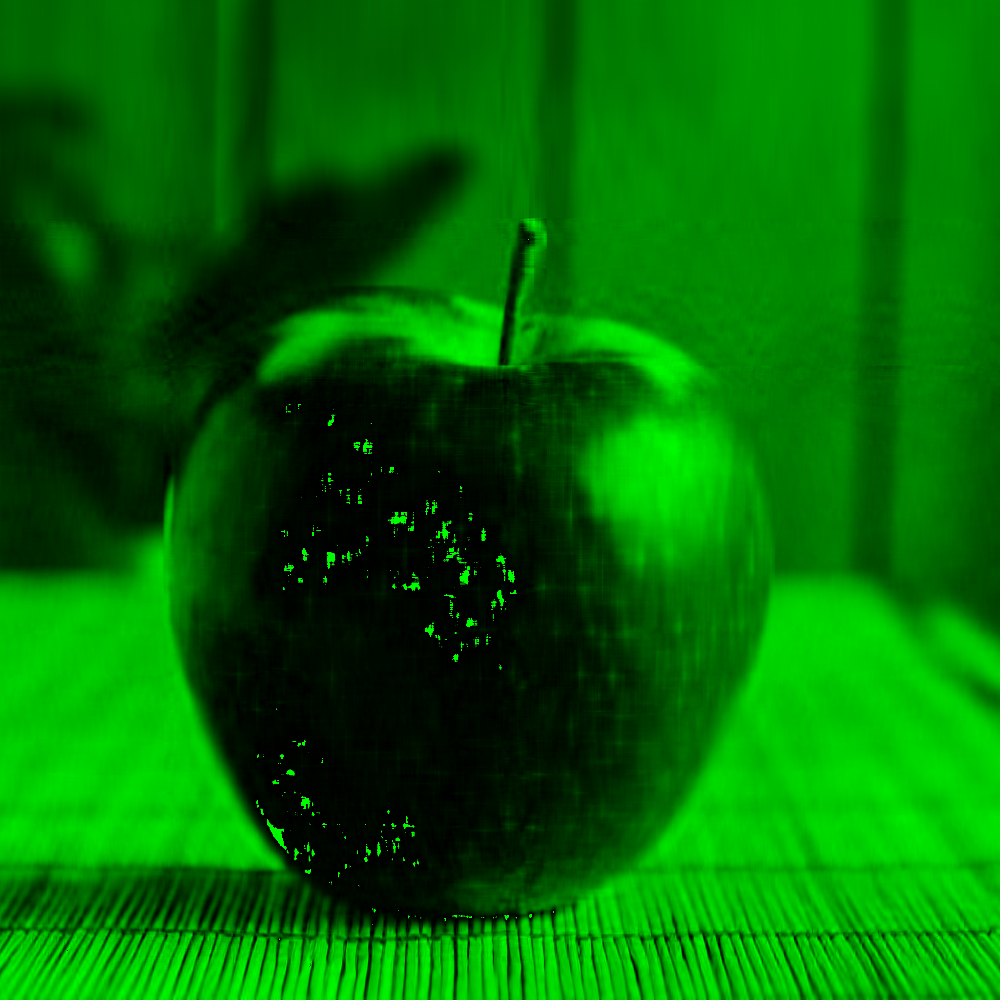

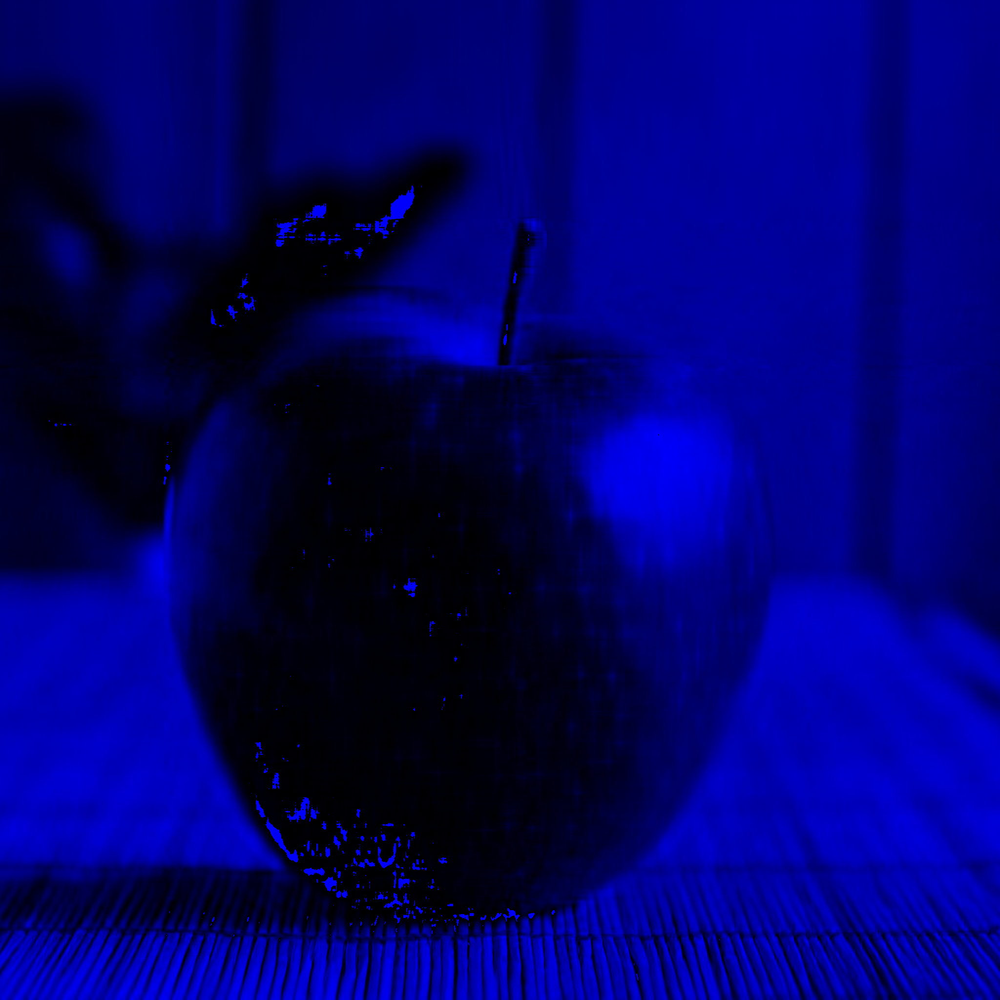

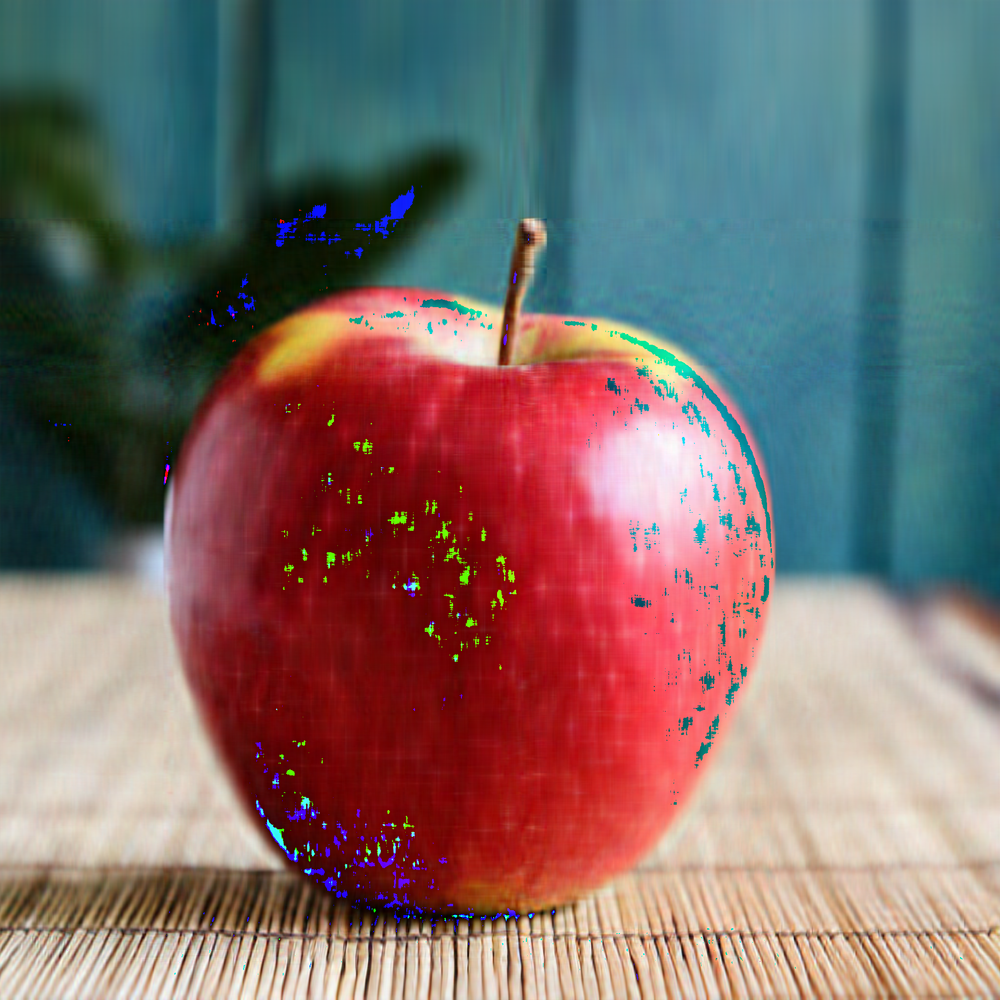

In [75]:
import random, math
import numpy as np
from PIL import Image

k = math.floor(random.random()*50)
print(k)

# original_arr, data = svd(np.asarray(Image.open('Apples/Real/Red Apples/Side Shots/red-apple-ss-2.jpg'))[(2240-2048)//2: (2240+2048)//2, (3984-2048)//2: (3984+2048)//2], 48)
# original_arr, data = svd(np.asarray(Image.open('Apples/Ai/Red Apples/Side Shots/red-apple-ss-20.jpg')), 48)
# img = Image.fromarray(original_arr.astype('uint8'), 'RGB')
# display(img)

arr = [0, 0, 0]
for i in range(3):
    u = df.iloc[k][4097*48*i: 4097*48*i + 2048*48].to_numpy().reshape([2048, 48])
    s = np.diag(df.iloc[k][4097*48*i + 2048*48: 4097*48*i + 2049*48].to_numpy())
    v = df.iloc[k][4097*48*i + 2049*48: 4097*48*i + 4097*48].to_numpy().reshape([48, 2048])
    arr[i] = u @ s @ v

temp_arr = np.array([[x, 0, 0] for x, y, z in zip(arr[0].flatten(), arr[1].flatten(), arr[2].flatten())]).reshape([2048, 2048, 3]).astype('uint8')
img = Image.fromarray(temp_arr, 'RGB')
display(img)
temp_arr = np.array([[0, y, 0] for x, y, z in zip(arr[0].flatten(), arr[1].flatten(), arr[2].flatten())]).reshape([2048, 2048, 3]).astype('uint8')
img = Image.fromarray(temp_arr, 'RGB')
display(img)
temp_arr = np.array([[0, 0, z] for x, y, z in zip(arr[0].flatten(), arr[1].flatten(), arr[2].flatten())]).reshape([2048, 2048, 3]).astype('uint8')
img = Image.fromarray(temp_arr, 'RGB')
display(img)
temp_arr = np.array([[x, y, z] for x, y, z in zip(arr[0].flatten(), arr[1].flatten(), arr[2].flatten())]).reshape([2048, 2048, 3]).astype('uint8')
img = Image.fromarray(temp_arr, 'RGB')
display(img)